# Using Higashi software suite for scHi-C analysis

**Note:** Change the path of the files accordingly!

# Step I: Install the packages
Copy the code block below and run it in the terminal. 
Some GPU related packages are recommended to be installed in advance:
- pytorch
- py3nvml

In [ ]:
git clone https://github.com/ma-compbio/Higashi
cd Higashi
python setup.py install
cd ../
git clone https://github.com/ma-compbio/Fast-Higashi
cd Fast-Higashi
python setup.py install
cd ../

# Step II: Prepare the input files

In this tutorial, we'll use the Lee et al. sn-m3c-seq dataset on human prefrontal cortex (PFC). 
Higashi software is compatible with two types of input format

**Format 1 (higashi_v1)**

You'll need two files:
- label_info.pickle (stores cell meta-information)
- data.txt (stores all the single cell contacts)

The label_info.pickle file can be generated via the following code.

In [ ]:
import pickle
import numpy as np

label_info = {'name': np.arange(1000),
              'age': np.ones(1000),
              }

pickle.dump(label_info, open("./label_info.pickle", "wb"))

As for the data.txt file, here's an example to give you an idea of the structure:  

In [9]:
import pandas as pd
data = pd.read_csv(
    "/home/rzhang/Data/scHiC_collection/m3c_human_pfc/tutorial/data.txt", 
    sep="\t", nrows=5)
data

,cell_id,chrom1,pos1,chrom2,pos2,count
0,1,chr1,100000,chr7,158600000,1
1,1,chr1,700000,chr10,39100000,1
2,1,chr1,900000,chr5,151500000,1
3,1,chr1,950000,chr1,66950000,1
4,1,chr1,950000,chr15,83600000,1


A tab separated file 
 - with the following columns: `['cell_id', 'chrom1', 'pos1', 'chrom2', 'pos2', 'count']` 
 - headers should be included in the first row).
 
1. `cell_id`: (int), id for each cell, start from 0. Must be continuous (0, 1, 2, ..., #cell - 1). The order of its appearance does not need to be sorted in the file.
2. `chrom1`: (str), chromosome name for fragment 1
3. `pos1`: (int), location for fragment 1
4. `chrom2`: (str), chromosome name for fragment 2
5. `pos2`: (int), location for fragment 2. Note that only intra-chromosomal reads are used in Higashi. No need to guarantee that fragment 2 has larger coordinate value than fragment 1.
6. `count`: (int or float), count number or normalized weight for the interaction.

**Format 2 (higashi_v2)**

You'll need:
- label_info.pickle (same as above)
- filelist.txt (a list of files, where each file correspond to the contacts in a single cell)
- Contact pair files

In [5]:
! head '//home/rzhang/Data/scHiC_collection/m3C_hg38_M1C/filelist.txt'

/home/rzhang/Data/scHiC_collection/m3C_hg38_M1C/cell_matrix/M1C_3C_001_Plate1-1-F3-A2.3C.contact.tsv.gz
/home/rzhang/Data/scHiC_collection/m3C_hg38_M1C/cell_matrix/M1C_3C_001_Plate1-1-F3-B1.3C.contact.tsv.gz
/home/rzhang/Data/scHiC_collection/m3C_hg38_M1C/cell_matrix/M1C_3C_001_Plate1-1-F3-B13.3C.contact.tsv.gz
/home/rzhang/Data/scHiC_collection/m3C_hg38_M1C/cell_matrix/M1C_3C_001_Plate1-1-F3-B14.3C.contact.tsv.gz
/home/rzhang/Data/scHiC_collection/m3C_hg38_M1C/cell_matrix/M1C_3C_001_Plate1-1-F3-B2.3C.contact.tsv.gz
/home/rzhang/Data/scHiC_collection/m3C_hg38_M1C/cell_matrix/M1C_3C_001_Plate1-1-F3-C1.3C.contact.tsv.gz
/home/rzhang/Data/scHiC_collection/m3C_hg38_M1C/cell_matrix/M1C_3C_001_Plate1-1-F3-C13.3C.contact.tsv.gz
/home/rzhang/Data/scHiC_collection/m3C_hg38_M1C/cell_matrix/M1C_3C_001_Plate1-1-F3-C14.3C.contact.tsv.gz
/home/rzhang/Data/scHiC_collection/m3C_hg38_M1C/cell_matrix/M1C_3C_001_Plate1-1-F3-C2.3C.contact.tsv.gz
/home/rzhang/Data/scHiC_collection/m3C_hg38_M1C/cell_matrix/

In [10]:
data = pd.read_csv("/home/rzhang/Data/scHiC_collection/m3C_hg38_M1C/"+                   
                   "cell_matrix/M1C_3C_001_Plate1-1-F3-A2.3C.contact.tsv.gz",
                   sep="\t", header=None)
data

,0,1,2,3,4,5,6,7
0,0,chr1,912166,0,0,chr1,35564581,1
1,0,chr1,924290,0,0,chr1,35429842,1
2,0,chr1,974822,0,0,chr1,1504453,1
3,0,chr1,974823,0,0,chr1,1504453,1
4,0,chr1,974824,0,0,chr1,1504453,1
...,...,...,...,...,...,...,...,...
569774,1,chrY,26541307,0,1,chrY,26548851,1
569775,1,chrY,26541307,0,1,chrY,26548852,1
569776,1,chrY,56702562,0,1,chrY,56711604,1
569777,1,chrY,56830293,0,1,chrY,56833166,1


Each contact pair file correspond to one single cell, and is stored in the tab-delimited format. Each file must include the following columns ``['chrom1', 'pos1', 'chrom2', 'pos2']``. The 'count' column is optional, and when not provided would be assumed as 1. The header of each file is optional.

# Step III: Configure the parameters
The detailed explanation of all the parameters is here: https://github.com/ma-compbio/Higashi/wiki/Configure-the-parameters
In this section, I'll provide an example config file and explain the parameters we used here:

In [4]:
config = '/home/rzhang/Higashi/config_dir/config_m3c_pfc_500Kb.JSON'
config_info = {
    "data_dir": "/home/rzhang/Data/scHiC_collection/m3c_human_pfc/tutorial",
    "structured": True,
    "input_format": 'higashi_v1',
    "temp_dir": "/home/rzhang/Higashi/Temp/m3c_pfc",
    "genome_reference_path": "/home/rzhang/Higashi/hg19.chrom.sizes.txt",
    "cytoband_path": "/home/rzhang/Higashi/cytoBand_hg19.txt",
    "chrom_list": ["chr1", "chr2","chr3","chr4","chr5",
                   "chr6","chr7","chr8","chr9","chr10",
                   "chr11","chr12","chr13","chr14","chr15",
                   "chr16","chr17","chr18","chr19","chr20",
                   "chr21","chr22"],
    "resolution": 500000,
    "resolution_cell": 500000,
    "resolution_fh": [500000],
    "embedding_name": "test",
    "minimum_distance": 500000,
    "maximum_distance": -1,
    "local_transfer_range": 0,
    "loss_mode": "zinb",
    "dimensions": 128,
    "impute_list":["chr1", "chr2","chr3","chr4","chr5",
                   "chr6","chr7","chr8","chr9","chr10",
                   "chr11","chr12","chr13","chr14","chr15",
                   "chr16","chr17","chr18","chr19","chr20",
                   "chr21","chr22"],
    "neighbor_num": 5,
    "cpu_num": 10,
    "gpu_num": 8,
    "batch_id": "batch id",
    "embedding_epoch":60,
    "correct_be_impute": True,
}
import json
with open(config,"w") as f:
    json.dump(config_info, f, indent = 6)

In [7]:
from IPython.display import Markdown, display
display(Markdown("../test.md"))

| params                | Type  | description                                                                                                                                                                       |
|:----------------------|:-----:|:----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------|
| data_dir              |  str  | Directory where the data are stored                                                                                                                                               |
| structured            | bool| Whether the data.txt file is structured (interaction pairs of a cell i is successive in the dataframe not randomly placed). It could save a lot of memory and time for processing |
| input_format          |  str  | How the data are stored. Can either be "higashi_v1" or "higashi_v2".                                                                                                              |
| header_included       | bool   | whether the header of the tab is included in each table                                                                                                                           |
| contact_header        | list   | The header of the contact pairs. Must include ["chrom1", "pos1", "chrom2","pos2"], when "count" is not included, the program assumes count=1 for all contact pairs                |
| temp_dir              |  str| Directory where the temporary files will be stored. An empty folder will be created if it doesn't exists.                                                                         |
| genome_reference_path |  str| Path of the genome reference file from USCS  Genome Browser, will be used to generate bin nodes                                                                                   |
| cytoband_path         |  str| Path of the cytoband reference file from USCS Genome Browser, will be used to remove centromere regions                                                                           |
| chrom_list            |  str| List of chromosomes to train the model on. The name convention should be the same as the data.txt and the genome_reference file                                                   |
| resolution            |  int| Resolution for imputation.                                                                                                                                                        |
| resolution_cell       |  int| Resolution for generate attributes of the cell nodes. Recommend to use 1Mb (data with lower coverage per cell) or 500Kb (data with higher coverage per cell).                     |
| resolution_fh | int| Resolution for Fast-Higashi.                                                                                                                                                      |
| embedding_name        |  str| Name of embedding vectors to store                                                                                                                                                |
| minimum_distance      |  int| Minimum genomic distance between a pair of genomc bins to impute (bp)                                                                                                             |
| maximum_distance      |  int| Maximum genomic distance between a pair of genomc bins to impute (bp, -1 represents no constraint)                                                                                |
| local_transfer_range  |  int| Number of neighboring bins in 1D genomic distance to consider during imputation (similar to the window size of linear convolution)                                                |
| loss_mode             |  str| Train the model in classification or ranking (can be either classification, rank, or zinb (zero-inflated negative binomial, **Recommended**))                                     |
| dimensions            |  int| Embedding dimensions                                                                                                                                                              |
| impute_list           |  int| List of chromosome to impute (must appear in the chrom list above)                                                                                                                |
| neighbor_num          |  int| Number of neighboring cells to incorporate when making imputation, the hyperparameter `k` in the manuscript                                                                       |
| cpu_num               |  int| Higashi is optimized for multiprocessing. Limit the number of cores to use with this param. -1 represents use all available cpu.                                                  |
| gpu_num               |  int| Higashi is optimized to utilize multiple gpus for computational efficiency. This parameters should be non negative.                                                               |

# Step IV: Start running Higashi
## 1. Import package, set the path to the configuration JSON file

In [18]:
from higashi.Higashi_wrapper import *
from fasthigashi.FastHigashi_Wrapper import *
config = '/home/rzhang/Higashi/config_dir/config_m3c_pfc_500Kb.JSON'
higashi_model = Higashi(config)

## 2. Process scHi-C data
This include: turning contacts into binned contact maps, converting into hypergraph format that Higashi will use. (Take a while but only need to be run once.)

In [ ]:
higashi_model.process_data()

## 3. Run the Fast-Higashi model on its own or as an initialization for Higashi
### 3.1 Initialize Fast-Higashi model and turn sparse matrices into sparse tensors

In [2]:
# Initialize the model
fh_model = FastHigashi(config_path=config,
                    path2input_cache="/home/rzhang/Higashi/Temp/m3c_pfc",
                    path2result_dir="/home/rzhang/Higashi/Temp/m3c_pfc",
                    off_diag=100, # 0-100th diag of the contact maps would be used.
                    filter=False, # fit the model on high quality cells, transform the rest
                    do_conv=False,# linear convolution imputation
                    do_rwr=False, # partial random walk with restart imputation
                    do_col=False, # sqrt_vc normalization
                    no_col=False) # force to not do sqrt_vc normalization

# Pack from sparse mtx to tensors
fh_model.prep_dataset()

setting to gpu:0
good 4145 bad 93
merge_fac_row 1
cache file = /home/rzhang/Higashi/Temp/m3c_pfc/cache_intra_500000.pkl
loading cached input from /home/rzhang/Higashi/Temp/m3c_pfc/cache_intra_500000.pkl
gpu mem
c_nvmlMemory_t(total: 25757220864 B, free: 25430523904 B, used: 326696960 B)
recommend_bs_cell [4238, 4238, 4238, 4238, 4238, 4238, 4238, 4238, 4238, 4238, 4238, 4238, 4238, 4238, 4238, 4238, 4238, 4238, 4238, 4238, 4238, 4238]


### 3.2 Run the model

In [3]:
fh_model.run_model(dim1=.6,
                rank=256,
                n_iter_parafac=1,
                extra="")

dim1_0.6_rank_256_niterp_1_
time elapsed: 0.01


initializing params:   0%|          | 0/22 [00:00<?, ?it/s]

rwr iters: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
time elapsed: 31.59
finish init
Starting iteration 0

PARAFAC2 re=5.644 takes 12.3s
Starting iteration 1

PARAFAC2 re=0.452 9.94e-01 variation min9.7e-01 at chrom 20, max1.0e+00 at chrom 1 takes 11.9s
Starting iteration 2

PARAFAC2 re=0.443 3.83e-02 variation min1.3e-02 at chrom 12, max5.2e-02 at chrom 1 takes 12.1s
Starting iteration 3

PARAFAC2 re=0.434 4.04e-02 variation min2.7e-02 at chrom 12, max5.0e-02 at chrom 8 takes 12.1s
Starting iteration 4

PARAFAC2 re=0.430 1.59e-02 variation min1.3e-02 at chrom 1, max2.3e-02 at chrom 13 takes 12.1s
Starting iteration 5

PARAFAC2 re=0.429 6.67e-03 variation min3.5e-03 at chrom 1, max1.2e-02 at chrom 13 takes 12.1s
Starting iteration 6

PARAFAC2 re=0.428 3.42e-03 variation min1.5e-03 at chrom 1, max6.5e-03 at chrom 12 takes 11.9s
Starting iteration 7

PARAFAC2 re=0.428 2.04e-03 variation min9.5e-04 at chrom 1, max3.9e-03 at chrom 12 takes 11.8s
Starting iteration 8

PARAFAC2 re=0.427 

### 3.3 Visualize the embedding results from Fast-Higashi

In [19]:
def vis_embedding(embedding, cell_type, batch, neuron_subtype):
    from umap import UMAP
    import seaborn as sns
    import matplotlib.pyplot as plt

    pal1 = {"L2/3": "#e51f4e", "L4": "#45af4b", "L5": "#ffe011", "L6": "#0081cc",
            "Ndnf": "#ff7f35", "Vip": "#951eb7", "Pvalb": "#4febee",
            "Sst": "#ed37d9", "Astro": "#d1f33c", "ODC": "#f9bdbb",
            "OPC": "#067d81", "MG": "#e4bcfc", "MP": "#ab6c1e",
            "Endo": "#780100"}

    vec = UMAP(n_components=2, n_neighbors=15, random_state=0).fit_transform(embedding)
    fig = plt.figure(figsize=(15, 10))
    ax = plt.subplot(2, 2, 1)
    sns.scatterplot(x=vec[:, 0], y=vec[:, 1], hue=cell_type, ax=ax, s=5, alpha=0.8, linewidth=0, palette=pal1)
    handles, labels = ax.get_legend_handles_labels()
    labels, handles = zip(*sorted(zip(labels, handles), key=lambda t: t[0]))
    ax.legend(handles=handles, labels=labels, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., ncol=1)
    ax.title.set_text("fig1: umap - major cell type")
    ax = plt.subplot(2, 2, 2)
    sns.scatterplot(x=vec[:, 0], y=vec[:, 1], hue=batch, ax=ax, s=5, alpha=0.8, linewidth=0)
    handles, labels = ax.get_legend_handles_labels()
    labels, handles = zip(*sorted(zip(labels, handles), key=lambda t: t[0]))
    ax.legend(handles=handles, labels=labels, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., ncol=1)
    ax.title.set_text("fig2: umap - batch id")
    
    neuron_mask = np.isin(cell_type, np.asarray(['L2/3', 'L4', 'L5', 'L6', 'Ndnf', "Vip", 'Pvalb', 'Sst']))

    pal_all = {"Exc_L1-3_CUX2":"#8b172f",
    "Exc_L2-4_RORB":"#f06d96",
    "Exc_L4-5_FOXP2":"#af9430",
    "Exc_L4-5_TOX":"#f8de5d",
    "Exc_L4-6_LRRK1":"#454520",
    "Exc_L4_PLCH1":"#47ae49",
    "Exc_L5-6_PDZRN4":"#3ebeb1",
    "Exc_L6_TLE4":"#56b6e7",
    "Exc_L6_TSHZ2":"#0b6c9f",
    "Inh_CGE-MGE_CHST9":"#fab18e",
    "Inh_CGE_LAMP5":"#9b74ac",
    "Inh_CGE_NDNF":"#f57f3a",
    "Inh_CGE_VIP":"#884197",
    "Inh_MGE_B3GAT2":"#dc9fc7",
    "Inh_MGE_CALB1":"#1a8989",
    "Inh_MGE_PVALB":"#74cdd8",
    "Inh_MGE_UNC5B":"#aad4f1",
    "Outlier": "#000000"}
    ax = plt.subplot(2, 2, 3)
    sns.scatterplot(x=vec[neuron_mask, 0], y=vec[neuron_mask, 1],
                    hue=neuron_subtype[neuron_mask], ax=ax, s=10, alpha=0.8, linewidth=0, palette=pal_all)
    handles, labels = ax.get_legend_handles_labels()
    labels, handles = zip(*sorted(zip(labels, handles), key=lambda t: t[0]))
    ax.legend(handles=handles, labels=labels, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., ncol=1)
    ax.title.set_text("fig3: only neuron cells - coordinate same as fig2")
    
    ax = plt.subplot(2, 2, 4)
    vec2 = UMAP(n_components=2, n_neighbors=15, random_state=0).fit_transform(embedding[neuron_mask])
    sns.scatterplot(x=vec2[:, 0], y=vec2[:, 1],
                    hue=neuron_subtype[neuron_mask], ax=ax, s=10, alpha=0.8, linewidth=0, palette=pal_all)
    handles, labels = ax.get_legend_handles_labels()
    labels, handles = zip(*sorted(zip(labels, handles), key=lambda t: t[0]))
    ax.legend(handles=handles, labels=labels, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., ncol=1)
    ax.title.set_text("fig4: UMAP on only neuron cells")
    plt.tight_layout()
    plt.show()
    return vec, vec2



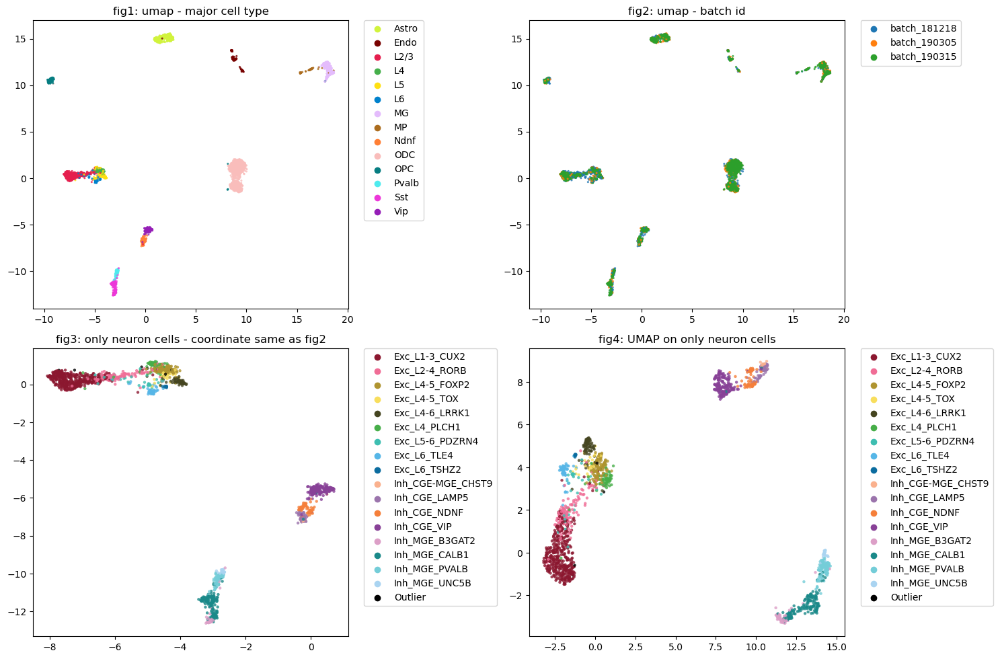

In [19]:
# fetch trained embeddings
embedding = fh_model.fetch_cell_embedding(final_dim=256)
cell_type = fh_model.label_info['cluster label']
batch = fh_model.label_info['batch id']
neuron_subtype = fh_model.label_info['major']
vis_embedding(embedding, cell_type, batch, neuron_subtype)

## 4. Run Higashi model for embeddings
Now by default, Higashi uses Fast-Higashi as hot initialization

In [20]:
higashi_model.prep_model()
# Stage 1 training
higashi_model.train_for_embeddings()

cpu_num 10
setting to gpu:6
training on data from: ['chr1', 'chr2', 'chr3', 'chr4', 'chr5', 'chr6', 'chr7', 'chr8', 'chr9', 'chr10', 'chr11', 'chr12', 'chr13', 'chr14', 'chr15', 'chr16', 'chr17', 'chr18', 'chr19', 'chr20', 'chr21', 'chr22']
total_sparsity_cell 0.13996900224314257
contractive loss
batch_size 512
Node type num [4238  499  487  397  383  362  343  319  293  283  272  271  268  231
  215  206  181  163  157  119  127   97  103] [ 4238  4737  5224  5621  6004  6366  6709  7028  7321  7604  7876  8147
  8415  8646  8861  9067  9248  9411  9568  9687  9814  9911 10014]
(4238, 3)
initial removing BE
initial removing BE
start making attribute


  0%|          | 0/300 [00:00<?, ?it/s]

loss 0.8153804540634155 loss best 0.7786072492599487 epochs 107

initializing data generator


  0%|          | 0/22 [00:00<?, ?it/s]

initializing data generator


  0%|          | 0/22 [00:00<?, ?it/s]

Visualize the embedding results from Higashi

Loading from last training results


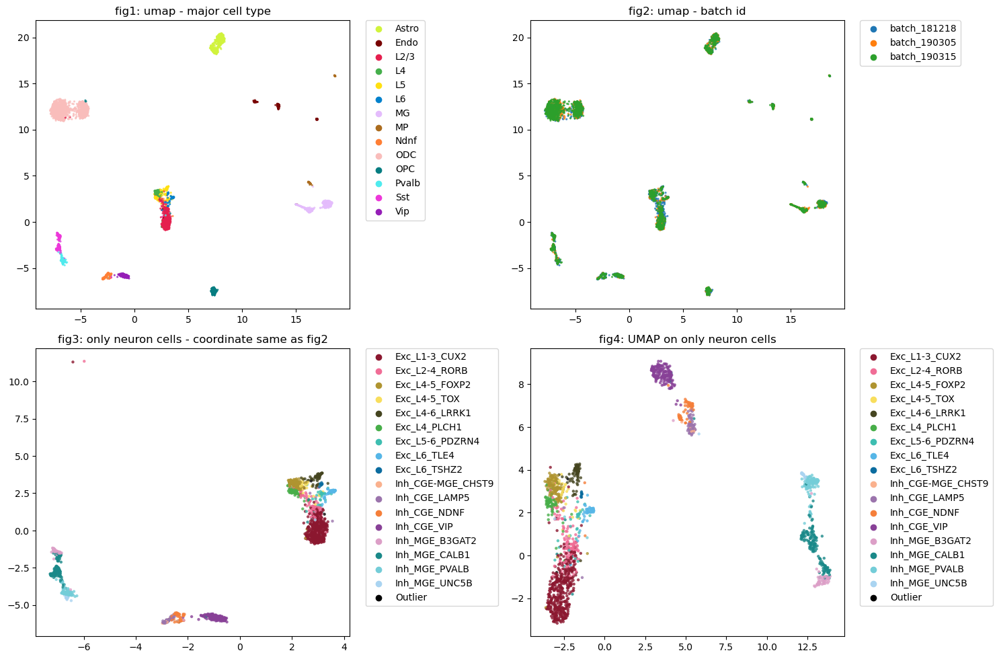

In [21]:
# fetch trained embeddings
embedding = higashi_model.fetch_cell_embeddings()

with open(os.path.join(higashi_model.data_dir, "label_info.pickle"), "rb") as f:
    label_info = pickle.load(f)

cell_type = np.asarray(label_info['cluster label'])
batch = np.asarray(label_info['batch id'])
neuron_subtype = np.asarray(label_info['major'])

vis_vec, _ = vis_embedding(embedding, cell_type, batch, neuron_subtype)

## 5. Use Higashi to impute the sparse contact maps

In [ ]:
higashi_model.train_for_imputation_nbr_0()
higashi_model.impute_no_nbr()
higashi_model.train_for_imputation_with_nbr()
higashi_model.impute_with_nbr()

## 6. Visually inspect the imputation results

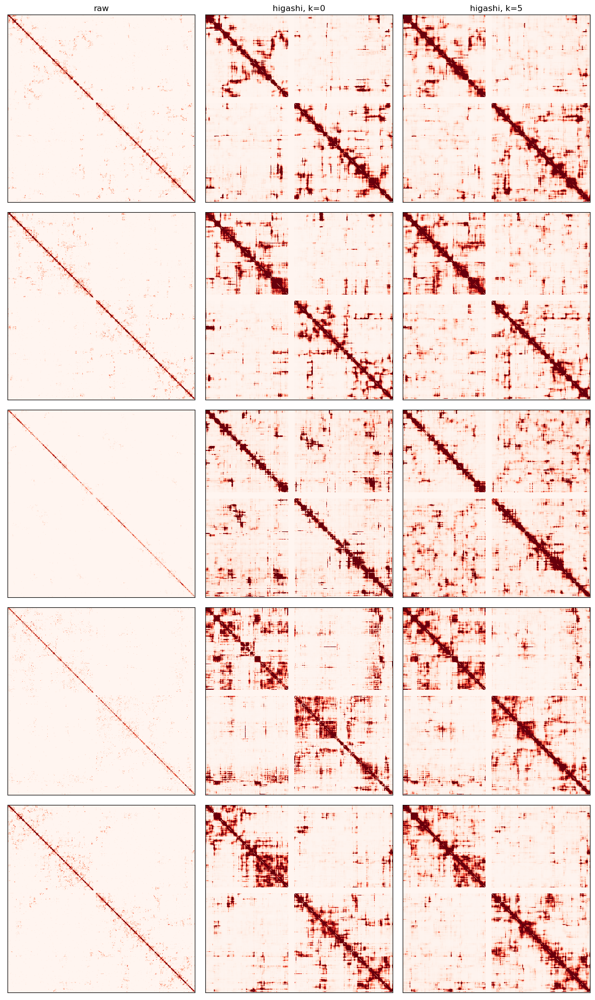

In [14]:
import matplotlib.pyplot as plt
count = 0
fig = plt.figure(figsize=(12, 4*5))
for id_ in np.random.randint(0, 4238, 5):
    # code to fetch imputed contact maps
    ori, nbr0, nbr5 = higashi_model.fetch_map("chr3", id_)
    count += 1
    ax = plt.subplot(5, 3, count * 3 - 2)
    ax.imshow(ori.toarray(), cmap='Reds', vmin=0.0, vmax=np.quantile(ori.data, 0.95))
    ax.set_xticks([], [])
    ax.set_yticks([], [])
    if count == 1:
        ax.set_title("raw")
    
    ax = plt.subplot(5, 3, count * 3 - 1)
    ax.imshow(nbr0.toarray(), cmap='Reds', vmin=0.0, vmax=np.quantile(nbr0.data, 0.95))
    ax.set_xticks([], [])
    ax.set_yticks([], [])
    if count == 1:
        ax.set_title("higashi, k=0")
    
    ax = plt.subplot(5, 3, count * 3)
    ax.imshow(nbr5.toarray(), cmap='Reds', vmin=0.0, vmax=np.quantile(nbr5.data, 0.95))
    ax.set_xticks([], [])
    ax.set_yticks([], [])
    if count == 1:
        ax.set_title("higashi, k=5")
    
plt.tight_layout()

## 6. Call single cell A/B values based on imputation

In [13]:
! python Higashi/higashi/scCompartment.py -c /home/rzhang/Higashi/config_dir/config_m3c_pfc_500Kb.JSON --calib_file Higashi/higashi/cpg_density_hg19_500k.txt --calib --neighbor

Namespace(config='/home/rzhang/Higashi/config_dir/config_m3c_pfc_500Kb.JSON', neighbor=True, output='scCompartment', calib_file='Higashi/higashi/cpg_density_hg19_500k.txt', calib=True)
(499, 499)
average cpg 0.0057554400000000006 0.017458719999999997
average cpg 0.01411490909090909 0.00598890909090909
100%|███████████████████████████████████████| 4238/4238 [01:47<00:00, 39.39it/s]
chr1 finished
(487, 487)
average cpg 0.012408333333333334 0.0059865000000000005
average cpg 0.014797833333333331 0.005568666666666667
100%|███████████████████████████████████████| 4238/4238 [01:26<00:00, 48.95it/s]
chr2 finished
(397, 397)
average cpg 0.015040666666666666 0.006067444444444445
average cpg 0.014632619047619049 0.005812952380952381
100%|███████████████████████████████████████| 4238/4238 [01:05<00:00, 65.05it/s]
chr3 finished
(383, 383)
average cpg 0.020802 0.0056298
average cpg 0.009988999999999998 0.006007714285714287
100%|███████████████████████████████████████| 4238/4238 [01:03<00:00, 66.23it

## 7. Analyze scA/B annotations

### 7.1 Clustering using scA/B


In [29]:
# fetch calculated scAB values
import h5py
import numpy as np

genome_scAB = []
with h5py.File("/home/rzhang/Higashi/Temp/m3c_pfc/scCompartment.hdf5", "r") as cp_f:
    print(cp_f.keys())
    cp = cp_f['compartment']

    for id_ in range(4238):
        v = np.array(cp['cell_%d' % id_])
        genome_scAB.append(v)

genome_scAB = np.stack(genome_scAB, axis=0)
print(genome_scAB.shape)

<KeysViewHDF5 ['compartment', 'compartment_raw', 'compartment_zscore']>
(4238, 5352)


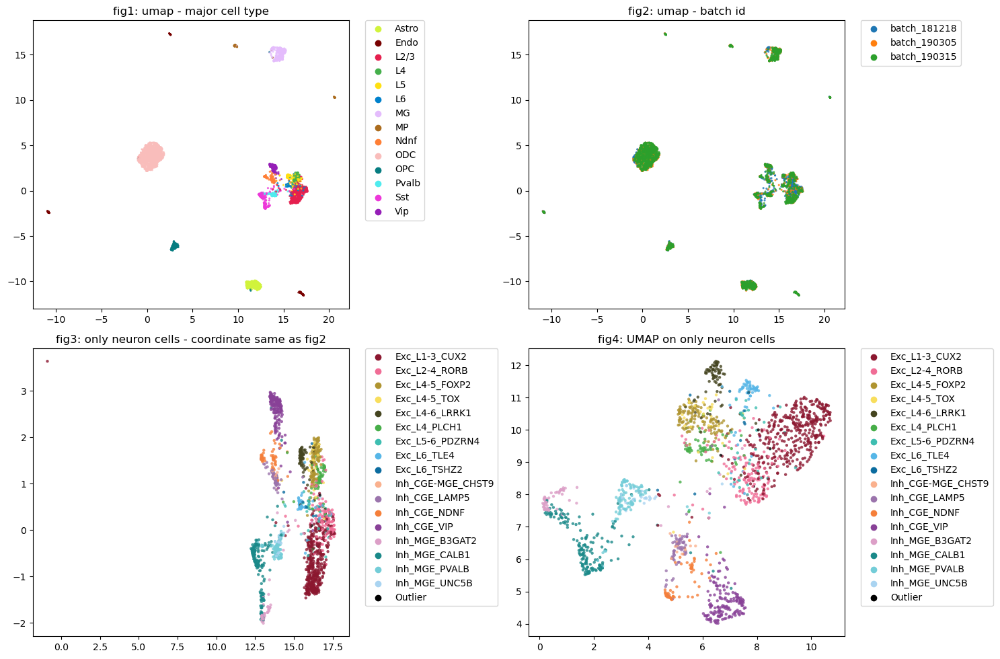

In [33]:
# directly using genome wide scAB as features for each cells
with open(os.path.join(higashi_model.data_dir, "label_info.pickle"), "rb") as f:
    label_info = pickle.load(f)
from sklearn.decomposition import PCA
feats = PCA(n_components=512).fit_transform(genome_scAB)
cell_type = np.asarray(label_info['cluster label'])
batch = np.asarray(label_info['batch id'])
neuron_subtype = np.asarray(label_info['major'])
vis_embedding(feats, cell_type, batch, neuron_subtype)

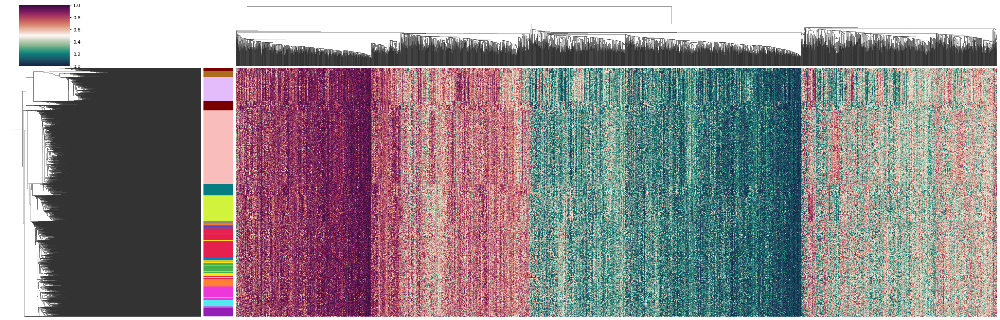

In [102]:
# Hierarchical clustering with genome wide scAB
import sys
sys.setrecursionlimit(10000)
import seaborn as sns
import scipy
import cmocean

feats = genome_scAB
cpal = sns.color_palette("cmo.curl", n_colors=128)
pal = {"L2/3": "#e51f4e", "L4": "#45af4b", "L5": "#ffe011", "L6": "#0081cc",
            "Ndnf": "#ff7f35", "Vip": "#951eb7", "Pvalb": "#4febee",
            "Sst": "#ed37d9", "Astro": "#d1f33c", "ODC": "#f9bdbb",
            "OPC": "#067d81", "MG": "#e4bcfc", "MP": "#ab6c1e",
            "Endo": "#780100"}

ax = sns.clustermap(feats, cmap=cpal, row_cluster=True, col_cluster=True,
               row_colors=[pal[l] for l in cell_type], figsize=(30, 10), vmin=0)
ax = ax.ax_heatmap
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)

### 7.2 Analyzing scA/B of marker genes for each cell type


In [24]:
res = 500000
import matplotlib.pyplot as plt
from scipy.stats import zscore
from sklearn.preprocessing import MinMaxScaler, quantile_transform
from higashi.Higashi_analysis.Higashi_analysis import *
def markergen_analysis_one(name, coor_dict, feats, label):
    info = pd.read_table("/home/rzhang/Data/scRNA_allen_brain/%s_kept.txt" % name, sep="\t")
    vec_all = []
    bins = []
    weight = []
    gene_count = 0
    for c, s, e, stra, w  in zip(np.array(info['chr']), np.array(info['start']), np.array(info['end']),
                             np.array(info['strand']), np.array(info['avg_log2FC'])):
        
        bin_start = int(math.floor(s / res))
        bin_end = int(math.ceil(e / res))
        
        
        if stra > 0:
            iter = range(bin_start, bin_end + 1)
        else:
            iter = range(bin_end, bin_start - 1, -1)
        
        for bin in iter:
            try:
                bin_ = coor_dict["chr%d:%d" % (int(c), int(bin * res))]
                bins.append(bin_)
                weight.append(w)
                # break
            except:
                # print ("chr%s:%d" % (c, int(bin * res)))
                continue
        gene_count += 1
        if gene_count >= 200:
            break
        if len(bins) >= (2000 * 100000 / res):
            break
    bins = np.array(bins)
    weight = np.array(weight)
    bins = np.unique(bins)
    vec = feats[:, bins]
    if name.split("_")[-1] in ['Inh', 'Exc', "VIP", "PVALB", "SST", 'L23', 'L4', 'L5', 'L6'] or name.split("_")[-1][0] == 'L':
        for l in ['Astro', 'ODC', 'OPC', 'Endo', 'MG']:
            vec[label == l, :] = np.nan
    if name in ["VIP", "PVALB", "SST"]:
        for l in ['L23', 'L4', 'L5', 'L6']:
            vec[label == l, :] = np.nan

    if name[0] == "L":
        for l in ['Vip', 'Ndnf', 'Pvalb', 'Sst']:
            vec[label == l, :] = np.nan


    return name, vec



def markergene_analysis(vis_vec=None):
    total_feats = []
    coor_dict = {}
    with h5py.File("/home/rzhang/Higashi/Temp/m3c_pfc/scCompartment.hdf5", "r") as cp_f:
#         print(cp_f.keys())
        if 'compartment-qtl' in cp_f.keys():
            cp = cp_f['compartment-qtl']
        else:
            cp = cp_f['compartment']
        bin_info = cp['bin']
        chrom, start = np.array(bin_info['chrom']).astype('str'), np.array(bin_info['start'])
        for i in range(len(chrom)):
            coor_dict["%s:%d" % (chrom[i], start[i])] = i
        for id_ in trange(len(cp.keys()) - 2):
            v = np.array(cp['cell_%d' % id_])
            total_feats.append(v)
    feats = np.stack(total_feats, axis=0)
#     print (feats.shape, feats)
    label = np.array(cell_type)
    
    
    import cmocean
    pal = {'Astro': '#d1f33c', 'ODC': '#f9bdbb',
           'OPC': '#067d81',
           "Endo": '#780100', 'MG': '#e4bcfc', 'L2/3': '#e51f4e', 'L4': '#45af4b', 'L5': '#ffe011', 'L6': '#0081cc',
           'Ndnf': '#ff7f35', 'Vip': '#951eb7', 'Pvalb': '#4febee',
           'Sst': '#ed37d9', }
    order = []
    cell_types = list(pal.keys())
    for a in pal:
        order1 = np.where(label == a)[0]
        np.random.shuffle(order1)
        order.append(order1)
    order = np.concatenate(order)
    
    label = label[order]
    feats = feats[order]
    name_list = ['Astro', 'Oligo', 'OPC', 'Endo', 'MG', 'Neuron', 'Exc', 'Inh']

    all_feats = [0 for i in range(len(name_list))]
    slices = []
    count = 0
    for name in name_list:
        name, vec = markergen_analysis_one(name, coor_dict, feats, label)
        all_feats[name_list.index(name)] = np.copy(vec)
        slices.append([count, count + vec.shape[-1]])
        count += vec.shape[-1]
        
    
    all_feats = np.concatenate(all_feats, axis=-1)
    all_feats -= np.nanmean(all_feats, axis=0, keepdims=True)

    all_feats[:, slices[0][0]:slices[6][0]] -= np.nanmean(all_feats[:, slices[0][0]:slices[6][0]], axis=1,
                                                              keepdims=True)
    all_feats[:, slices[6][0]:slices[7][1]] -= np.nanmean(all_feats[:, slices[6][0]:slices[7][1]], axis=1,
                                                              keepdims=True)

    
    import matplotlib as mpl
    cpal = plt.get_cmap("RdBu_r")
    new_all_feats = []
    for i in range(len(slices)):
        new_all_feats.append(np.nanmean(all_feats[:, slices[i][0]: slices[i][1]], keepdims=True, axis=1))
    all_feats = np.concatenate(new_all_feats, axis=-1)

    if vis_vec is not None:
        vis_vec = vis_vec[order]
        fig = plt.figure(figsize=(15, 14))
        ax = plt.subplot(4, 3, 1)
        sns.scatterplot(x=vis_vec[:, 0], y=vis_vec[:, 1], hue=label, linewidth=0, s=2, alpha=1.0, palette=pal, ax=ax)
        handles, labels = ax.get_legend_handles_labels()
        labels, handles = zip(*sorted(zip(labels, handles), key=lambda t: t[0]))
        ax.legend(handles=handles, labels=labels, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., ncol=2)
        ax.title.set_text("cell type")
        for i in range(all_feats.shape[-1]):
            ax = plt.subplot(4, 3, i+4)
            sns.scatterplot(x=vis_vec[:, 0], y=vis_vec[:, 1], hue=all_feats[:, i], linewidth=0, s=2, alpha=1.0, palette='RdBu_r', ax=ax)
            handles, labels = ax.get_legend_handles_labels()
            labels, handles = zip(*sorted(zip(labels, handles), key=lambda t: t[0]))
            ax.legend(handles=handles, labels=labels, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
            ax.title.set_text("scAB on markers for:"+name_list[i])

        plt.tight_layout()
    tab = pd.DataFrame(all_feats.T, index=name_list)
    import cmocean
    vmin = -0.03
    vmax = 0.03
    sns.clustermap(tab, row_cluster=False, col_cluster=False, col_colors=[pal[l] for l in label], cmap=cpal, figsize=(12, 4), yticklabels=1, vmin=vmin, vmax=vmax)
    from matplotlib.patches import Patch
    handles = [Patch(facecolor=pal[name]) for name in cell_types]
    plt.legend(handles, cell_types, title='cell types',
               bbox_to_anchor=(0, 0), bbox_transform=plt.gcf().transFigure, loc='lower left')

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4238/4238 [00:00<00:00, 5251.49it/s]


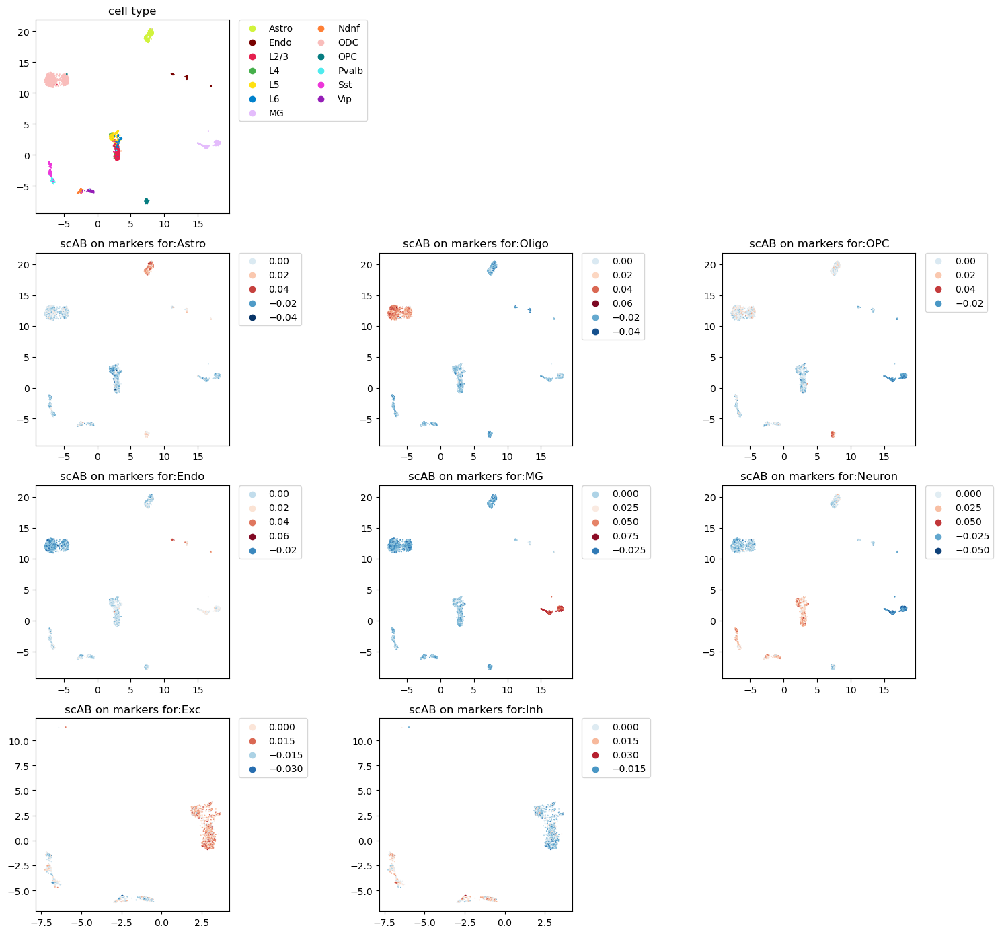

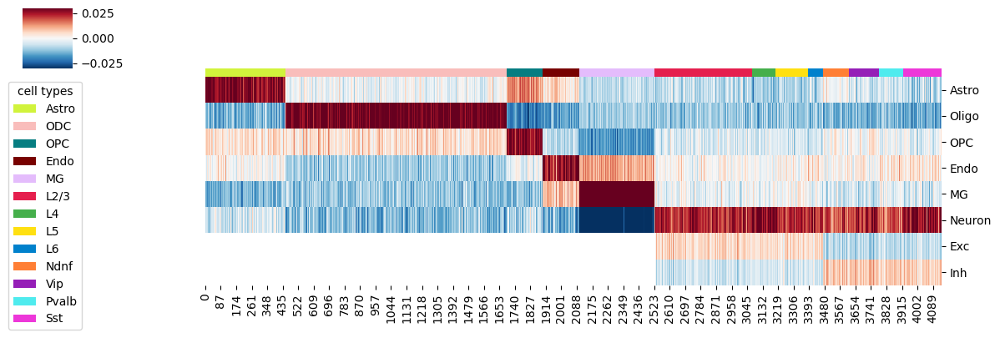

In [25]:
markergene_analysis(vis_vec=vis_vec)

## scTAD analysis

check here: https://github.com/ma-compbio/Higashi/wiki/Single-cell-TAD-calling